In [15]:
import sys
sys.path.insert(1, '/home/thomas/research/projects/emt/src/3-compute/tools/')

import warnings
warnings.filterwarnings("ignore")

import glob
import pickle
from traj_class import single_cell_traj,fluor_single_cell_traj
import math
import matplotlib.pyplot as plt
import numpy as np
from os import listdir
from skimage.io import imread
from skimage.measure import regionprops
from skimage.filters.rank import otsu
from skimage.morphology import opening, area_closing, diameter_closing, closing, remove_small_holes, remove_small_objects,\
     local_maxima, h_maxima, disk, dilation,area_opening
import mahotas.features.texture as mht
from scipy.stats import skew, kurtosis

In [2]:
dataset='01-13-22'
posi='XY1'

main_path='/home/thomas/research/projects/emt/data/'
output_path=main_path+'out/pcna/'+dataset+'_72hr_no-treat/'
cell_seg_path = output_path+posi+'/seg/'
# img_path = main_path+'ori/01-13-22_72hr_no-treat/XY1/' # local
img_path = '/home/thomas/csb-mnt/data/ori/pcna/'+dataset+'_72hr_no-treat/'+posi+'/'
cell_seg_list = sorted(listdir(cell_seg_path))
pcna_img_list = sorted(glob.glob(img_path+'*C2*'))

# look at all cells in one picture

In [ ]:
curr_t = 673
fluor_img = imread(pcna_img_list[curr_t-1])
seg_img = imread(cell_seg_path + cell_seg_list[curr_t-1])

rps = regionprops(seg_img)
for r in rps:
    crop_fluor_img = fluor_img[r.bbox[0]:r.bbox[2], r.bbox[1]:r.bbox[3]]
    cell_mask = (seg_img == r.label)
    cell_fluor_img = (fluor_img*cell_mask)[r.bbox[0]:r.bbox[2],r.bbox[1]:r.bbox[3]]

    nuc_mask=cell_fluor_img>otsu(cell_fluor_img,selem=disk(max(cell_fluor_img.shape)/2), mask=cell_fluor_img>0)
    nuc_mask=remove_small_objects(opening(nuc_mask),100)
    if np.sum(nuc_mask) >= 0.1*np.sum(cell_mask):

        # original nucleus stats
        ori_nuc_area=np.sum(nuc_mask)
        nuc_radius = round(math.sqrt(np.sum(nuc_mask)/math.pi))
        
        # smoothening + dilation
        nuc_mask=closing(nuc_mask,disk(round(nuc_radius/3)))
        nuc_mask=opening(nuc_mask,disk(round(nuc_radius/3)))
        nuc_mask=remove_small_holes(nuc_mask,100)
        curr_nuc_area=np.sum(nuc_mask)
        if curr_nuc_area < ori_nuc_area:
            while curr_nuc_area < ori_nuc_area:
                nuc_mask = dilation(nuc_mask)
                curr_nuc_area=np.sum(nuc_mask)
        nuc_mask=nuc_mask*cell_mask[r.bbox[0]:r.bbox[2],r.bbox[1]:r.bbox[3]]
        cell_nuc_img=nuc_mask*2 + (cell_mask*1)[r.bbox[0]:r.bbox[2],r.bbox[1]:r.bbox[3]]
                
        fig, axs = plt.subplots(1,2,figsize=(10, 7))
        axs[0].set_title('img num ' + str(curr_t) + ', obj num ' + str(r.label))

        axs[0].set_xlabel('nuclear radius: ' + str(nuc_radius))
        axs[0].imshow(cell_fluor_img)
        axs[1].imshow(cell_nuc_img)

# look at cells in a trajectory

In [15]:
sct_dir_name = 'sct-tlt_288'
sct_name = 'sub_XY2_179-01-13-22'


main_path='/home/thomas/research/projects/a549_40x/data/'
output_path=main_path+'out/pcna/01-13-22_72hr_no-treat/'
sct_path=output_path+'traj/'+sct_dir_name+'/'
sct_path=sct_path+sct_name

cell_seg_path = output_path+'XY2/seg/'
pcna_img_path = main_path+'ori/pcna/01-13-22_72hr_no-treat/XY2_C2/'
cell_seg_list = sorted(listdir(cell_seg_path))
pcna_img_list = sorted(listdir(pcna_img_path))

with open (sct_path, 'rb') as fp:
        sct = pickle.load(fp)
traj_seri = sct.traj_seri
sct_time = sct.traj_seri[:,0]
sct_mean_int = sct.traj_pcna_feature_values[0]

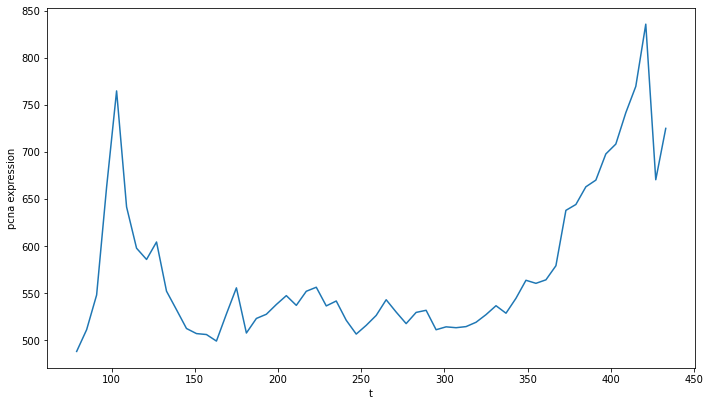

In [16]:


fig = plt.figure(figsize=(9,5))
ax = fig.add_axes([0,0,1,1])
ax.plot(sct_time,sct_mean_int)
ax.set_ylabel('pcna expression')
ax.set_xlabel('t')
plt.savefig('filename.jpg',bbox_inches='tight', dpi=150)
plt.show()

In [84]:
curr_traj_t_idx = 2
curr_t = traj_seri[curr_traj_t_idx][0]
curr_obj_num = traj_seri[curr_traj_t_idx][1]
print(curr_t,curr_obj_num)
fluor_img = imread(pcna_img_path + pcna_img_list[curr_t-1])
seg_img = imread(cell_seg_path + cell_seg_list[curr_t-1])

rps = regionprops(seg_img)
for r in rps:
    if r.label == curr_obj_num:
        crop_fluor_img = fluor_img[r.bbox[0]:r.bbox[2], r.bbox[1]:r.bbox[3]]
        cell_mask = (seg_img == curr_obj_num)
        cell_fluor_img = (fluor_img*cell_mask)[r.bbox[0]:r.bbox[2],r.bbox[1]:r.bbox[3]]

        nuc_mask=cell_fluor_img>otsu(cell_fluor_img,selem=disk(max(cell_fluor_img.shape)/2), mask=cell_fluor_img>0)
        nuc_mask=remove_small_objects(opening(nuc_mask),100)
        print(np.sum(nuc_mask))
        
        nuc_mask=closing(nuc_mask,disk(7))
        nuc_mask=opening(nuc_mask,disk(7))
        
        
        # nuc_mask=area_closing(nuc_mask,area_threshold=1,connectivity=2)
        print(np.sum(nuc_mask))
        # nuc_mask=diameter_closing(nuc_mask)
        nuc_mask=remove_small_holes(nuc_mask,100)
        

        nuc_fluor_img=(crop_fluor_img*nuc_mask)

        cell_mean_intensity = np.sum(cell_fluor_img) * 1.0 / r.area
        nuc_mean_intensity=np.sum(nuc_fluor_img)*1.0/np.sum(nuc_mask)
        print('nuc mean int: '+str(nuc_mean_intensity))

91 28
724
711
nuc mean int: 550.5850914205345


(61, 58)


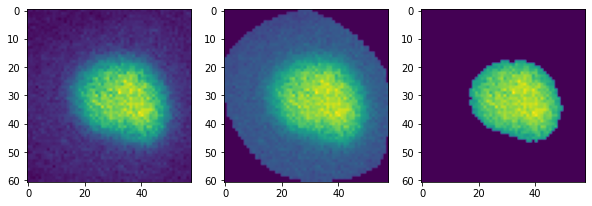

In [85]:
fig, axs = plt.subplots(1,3,figsize=(10, 7))
axs[0].imshow(crop_fluor_img)
axs[1].imshow(cell_fluor_img)
axs[2].imshow(nuc_fluor_img)
plt.savefig('filename.jpg',bbox_inches='tight', dpi=150)
print(nuc_mask.shape)

# calculate histogram features in a nucleus

look at cells in the image, pick one to focus on

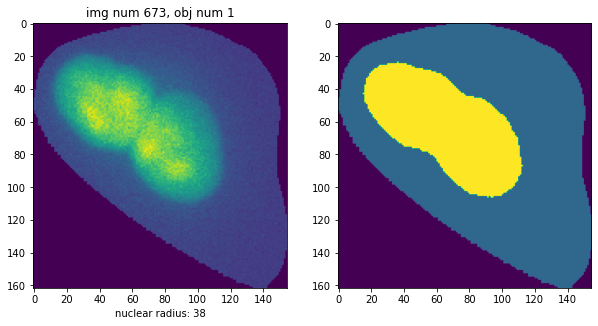

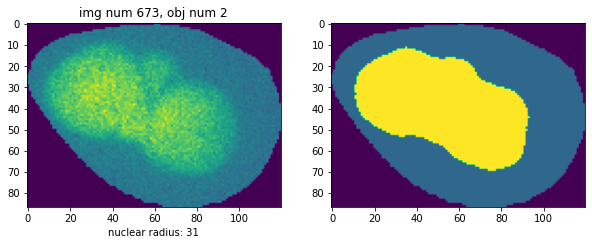

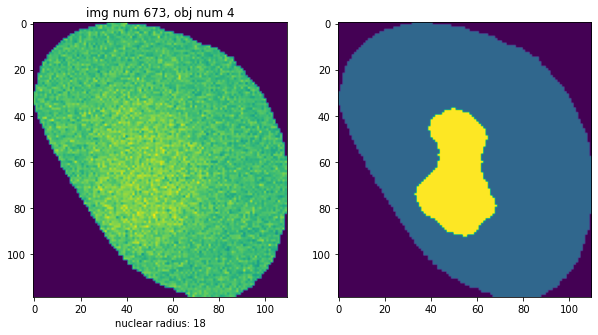

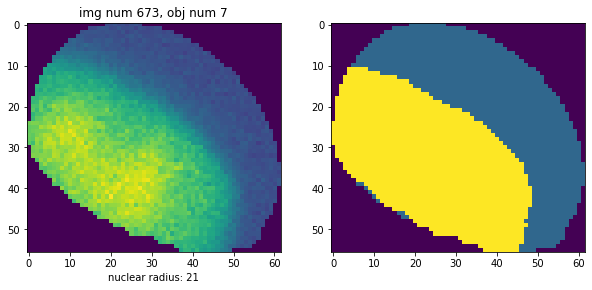

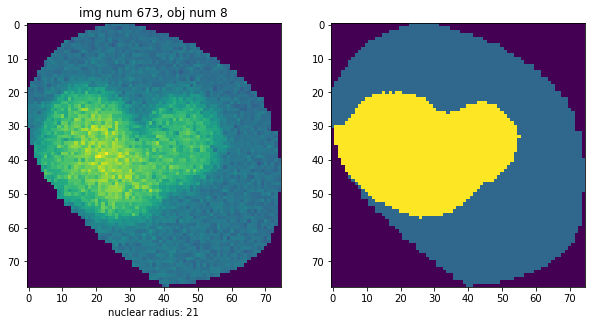

...

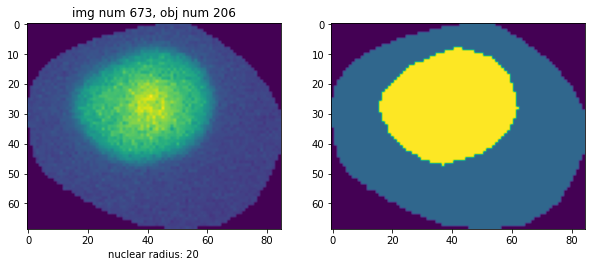

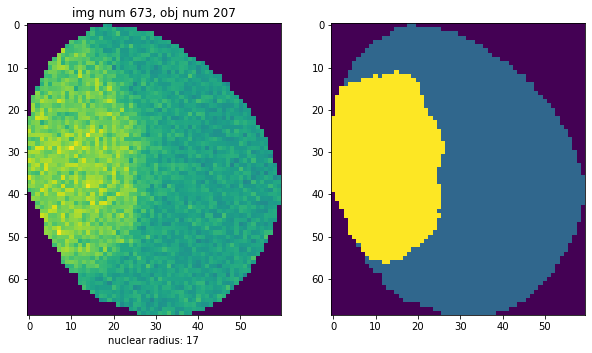

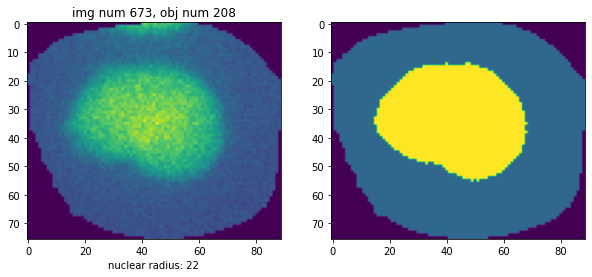

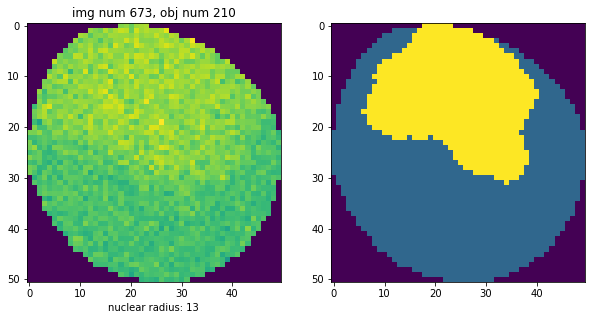

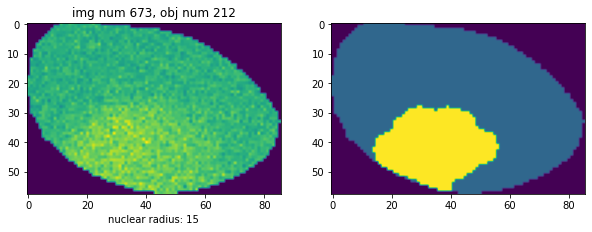

In [6]:
curr_t = 673
fluor_img = imread(pcna_img_list[curr_t-1])
seg_img = imread(cell_seg_path + cell_seg_list[curr_t-1])

rps = regionprops(seg_img)
for r in rps:
    crop_fluor_img = fluor_img[r.bbox[0]:r.bbox[2], r.bbox[1]:r.bbox[3]]
    cell_mask = (seg_img == r.label)
    cell_fluor_img = (fluor_img*cell_mask)[r.bbox[0]:r.bbox[2],r.bbox[1]:r.bbox[3]]

    nuc_mask=cell_fluor_img>otsu(cell_fluor_img,selem=disk(max(cell_fluor_img.shape)/2), mask=cell_fluor_img>0)
    nuc_mask=remove_small_objects(opening(nuc_mask),100)
    if np.sum(nuc_mask) >= 0.1*np.sum(cell_mask):

        # original nucleus stats
        ori_nuc_area=np.sum(nuc_mask)
        nuc_radius = round(math.sqrt(np.sum(nuc_mask)/math.pi))
        
        # smoothening + dilation
        nuc_mask=closing(nuc_mask,disk(round(nuc_radius/3)))
        nuc_mask=opening(nuc_mask,disk(round(nuc_radius/3)))
        nuc_mask=remove_small_holes(nuc_mask,100)
        curr_nuc_area=np.sum(nuc_mask)
        if curr_nuc_area < ori_nuc_area:
            while curr_nuc_area < ori_nuc_area:
                nuc_mask = dilation(nuc_mask)
                curr_nuc_area=np.sum(nuc_mask)
        nuc_mask=nuc_mask*cell_mask[r.bbox[0]:r.bbox[2],r.bbox[1]:r.bbox[3]]
        cell_nuc_img=nuc_mask*2 + (cell_mask*1)[r.bbox[0]:r.bbox[2],r.bbox[1]:r.bbox[3]]
                
        fig, axs = plt.subplots(1,2,figsize=(10, 7))
        axs[0].set_title('img num ' + str(curr_t) + ', obj num ' + str(r.label))

        axs[0].set_xlabel('nuclear radius: ' + str(nuc_radius))
        axs[0].imshow(cell_fluor_img)
        axs[1].imshow(cell_nuc_img)

calculate histogram features
70

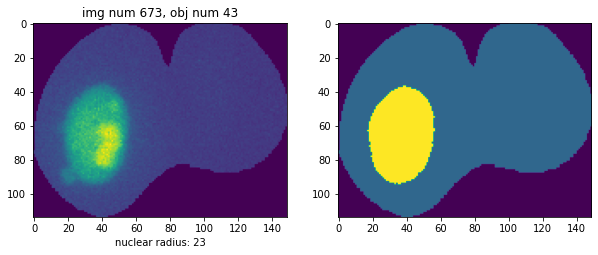

In [38]:
curr_t = 673
curr_obj = 43
fluor_img = imread(pcna_img_list[curr_t-1])
seg_img = imread(cell_seg_path + cell_seg_list[curr_t-1])

rps = regionprops(seg_img)
for r in rps:
    if r.label==curr_obj:
        crop_fluor_img = fluor_img[r.bbox[0]:r.bbox[2], r.bbox[1]:r.bbox[3]]
        cell_mask = (seg_img == r.label)
        cell_fluor_img = (fluor_img*cell_mask)[r.bbox[0]:r.bbox[2],r.bbox[1]:r.bbox[3]]

        nuc_mask=cell_fluor_img>otsu(cell_fluor_img,selem=disk(max(cell_fluor_img.shape)/2), mask=cell_fluor_img>0)
        nuc_mask=remove_small_objects(opening(nuc_mask),100)
        if np.sum(nuc_mask) >= 0.1*np.sum(cell_mask):

            # original nucleus stats
            ori_nuc_area=np.sum(nuc_mask)
            nuc_radius = round(math.sqrt(np.sum(nuc_mask)/math.pi))
            
            # smoothening + dilation
            nuc_mask=closing(nuc_mask,disk(round(nuc_radius/3)))
            nuc_mask=opening(nuc_mask,disk(round(nuc_radius/3)))
            nuc_mask=remove_small_holes(nuc_mask,100)
            curr_nuc_area=np.sum(nuc_mask)
            if curr_nuc_area < ori_nuc_area:
                while curr_nuc_area < ori_nuc_area:
                    nuc_mask = dilation(nuc_mask)
                    curr_nuc_area=np.sum(nuc_mask)
            nuc_mask=nuc_mask*cell_mask[r.bbox[0]:r.bbox[2],r.bbox[1]:r.bbox[3]]
            cell_nuc_img=nuc_mask*2 + (cell_mask*1)[r.bbox[0]:r.bbox[2],r.bbox[1]:r.bbox[3]]
                    
            fig, axs = plt.subplots(1,2,figsize=(10, 7))
            axs[0].set_title('img num ' + str(curr_t) + ', obj num ' + str(r.label))

            axs[0].set_xlabel('nuclear radius: ' + str(nuc_radius))
            axs[0].imshow(cell_fluor_img)
            axs[1].imshow(cell_nuc_img)

nuc_fluor_img=nuc_mask*cell_fluor_img
int_prof = nuc_fluor_img[np.nonzero(nuc_fluor_img)]

int_mean=np.sum(int_prof)/np.sum(nuc_mask)
int_min,int_max=np.quantile(int_prof,0.02),np.quantile(int_prof,0.98)
int_std=np.std(int_prof)
int_skew=skew(int_prof)
int_kurt=kurtosis(int_prof,fisher=True)
hist_fea=np.array([int_mean,int_min,int_max,int_std,int_skew,int_kurt]) # histogram features

nuc_img = nuc_mask*cell_fluor_img
fl_hara=mht.haralick(nuc_img, ignore_zeros=True,return_mean=True) # fluorescent haralick

0.4298678107092265
-0.291125505987869


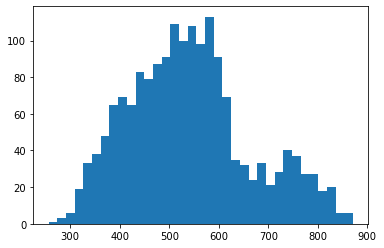

In [35]:
plt.hist(int_prof,bins=35)
skewness = skew(int_prof)
print(skewness)
print(int_kurt)

In [37]:
test = np.array([int_mean,int_min,int_max,int_std,int_skew,int_kurt])